# Progress Report: Comparison Between *Studying* And *Working* population 
##Group ID: 16 - Arman Torikoglu, Id: 25005 - Efehan Guner, Id: 25151
The aim of this project is to find if there is a significant difference in accomodation preferences between studying generation and working population by inferring the generations by their closeness to their everyday destinations.



Importing Modules


In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
path_prefix = "/content/drive/My Drive/Project"
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import geopy
from os.path import join
from geopy.distance import geodesic
import folium

Mounted at /content/drive


##Datasets:
We used 3 additional datasets besides the main dataset, 2 datasets are used to reduce the bias while finding the studying population, schools and cafes, business dataset is to find the working population.

*   Airbnb Property list - Original site: https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data
*   Schools and their Locations dataframe - Original site: 
https://data.cityofnewyork.us/Education/2017-2018-School-Locations/p6h4-mpyy
*   Cafe locations - Original site: https://data.cityofnewyork.us/City-Government/Sidewalk-Caf-Regulations-GIS-Geodatabase/mran-v46w

*   Business locations - Original site: https://data.cityofnewyork.us/Business/Legally-Operating-Businesses/w7w3-xahh



In [0]:
airbnb_fName = "AB_NYC_2019.csv"
airbnb_df = pd.read_csv(join(path_prefix, airbnb_fName))
schools_fName = "2017_-_2018_School_Locations.csv"
schools_df = pd.read_csv(join(path_prefix, schools_fName))
cafe_fname = "Sidewalk_Caf__Licenses_and_Applications.csv"
cafe_df = pd.read_csv(join(path_prefix, cafe_fname))
businessFname = "Legally_Operating_Businesses.csv"
business_df = pd.read_csv(join(path_prefix, businessFname))

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (19,20) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


*Airbnb Properties Dataset*

In [0]:
airbnb_df.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355


*Schools Dataset*

In [0]:
schools_df.head(2)

,FISCAL_YEAR,ATS SYSTEM CODE,LOCATION_CODE,LOCATION_NAME,BEDS NUMBER,MANAGED_BY_NAME,LOCATION_TYPE_DESCRIPTION,LOCATION_CATEGORY_DESCRIPTION,GRADES_TEXT,GRADES_FINAL_TEXT,OPEN_DATE,STATUS_DESCRIPTIONS,PRIMARY_BUILDING_CODE,PRIMARY_ADDRESS_LINE_1,STATE_CODE,X_COORDINATE,Y_COORDINATE,COMMUNITY_DISTRICT,COUNCIL_DISTRICT,CENSUS_TRACT,BOROUGH_BLOCK_LOT,NTA,NTA_NAME,PRINCIPAL_NAME,PRINCIPAL_TITLE,PRINCIPAL_PHONE_NUMBER,FAX_NUMBER,GEOGRAPHICAL_DISTRICT_CODE,ADMIN_DISTRICT_LOCATION_CODE,ADMINISTRATIVE_DISTRICT_NAME,COMMUNITY_SCHOOL_SUP_NAME,FIELD_SUPPORT_CENTER_NAME,FIELD_SUPPORT_CENTER_LEADER_NAME,SCHOOL_SUPPORT_TEAM_NAME,SCHOOL_SUPPORT_TEAM_LEADER_NAME,HIGHSCHOOL_NETWORK_LOCATION_CODE,HIGHSCHOOL_NETWORK_NAME,HIGHSCHOOL_NETWORK_SUPERINTENDENT,Location 1
0,2018,01M015,M015,P.S. 015 Roberto Clemente,310100010015,DOE,General Academic,Elementary,"PK,0K,01,02,03,04,05,SE","PK,0K,01,02,03,04,05",07/01/1904 12:00:00 AM,Open,M015,333 EAST 4 STREET,NY,990141.0,202349.0,103,2,2601,1003740020,MN28,Lower East Side ...,IRENE SANCHEZ,PRINCIPAL,212-228-8730,212-477-0931,1,M801,COMMUNITY SCHOOL DISTRICT 01,"PHILLIPS, DANIELLA",Field Support Center - Manhattan,"CHU, YUET",School Support Team 3- Manhattan,NaN,NaN,NaN,NaN,"333 EAST 4 STREET\nMANHATTAN, NY 10009\n(40.72..."
1,2018,01M019,M019,P.S. 019 Asher Levy,310100010019,DOE,General Academic,Elementary,"PK,0K,01,02,03,04,05,SE","PK,0K,01,02,03,04,05",07/01/1956 12:00:00 AM,Open,M019,185 1 AVENUE,NY,988547.0,205239.0,103,2,4000,1004530034,MN22,East Village ...,JACQUELINE FLANAGAN,PRINCIPAL,212-533-5340,212-673-1477,1,M801,COMMUNITY SCHOOL DISTRICT 01,"PHILLIPS, DANIELLA",Field Support Center - Manhattan,"CHU, YUET",School Support Team 3- Manhattan,NaN,NaN,NaN,NaN,"185 1 AVENUE\nMANHATTAN, NY 10003\n(40.730009,..."


*Cafes dataset*

In [0]:
cafe_df.head(2)

,LICENSE_NBR,LIC_STATUS,BUSINESS_NAME,BUSINESS_NAME2,BUILDING,STREET,CITY,STATE,ZIP,SWC_TYPE,SWC_SQ_FT,SWC_TABLES,SWC_CHAIRS,DOHMH,LATITUDE,LONGITUDE,COMMUNITY_DISTRICT,CITY_COUNCIL_DISTRICT,CD_URL,APP_ID,APP_SWC_TYPE,APP_SQ_FT,APP_TABLES,APP_CHAIRS,APP_STATUS,APP_STATUS_DATE,EXPIRATION_DATE,APP_TOO_DATE,SUBMIT_DATE,INTAKE,INTAKE_DD,DPQA,SEND_PACKAGE_DD,CP,CP_DD,CB,CB_DD,HEARING,HEARING_DD,HEARING_PUBLIC,HEARING_PUBLIC_DD,CC,CC_DD,MOO,MOO_DD,ISSUANCE,ISSUANCE_DD
0,2083447-DCA,Active,26-05 HOSPITALITY LLC,NaN,2605,28TH ST,ASTORIA,NY,11102,Unenclosed,506.0,22,38,50086288,40.770526,-73.920928,401,22,http://www.nyc.gov/html/qnscb1/html/home/home....,18263-2018-ASWC,Unenclosed,506.0,22,38,Application Review Completed,06/29/2019,04/15/2021,NaN,12/17/2018,Ready For Review,12/20/2018,Approved,12/20/2018,NaN,NaN,Recommend Approval,01/10/2019,Recommendation Issued,02/28/2019,SWC Public Hearing,02/06/2019,Review Period Expired,04/11/2019,Approved,06/29/2019,Issued,06/29/2019
1,1281748-DCA,Active,"316 BOWERY, LLC",NaN,316,BOWERY,NEW YORK,NY,10012,Unenclosed,400.0,17,34,41314372,40.725185,-73.992395,102,1,http://www.nyc.gov/manhattancb2,2432-2019-RSWC,Unenclosed,400.0,17,34,Application Review Completed,05/28/2019,12/15/2020,NaN,01/16/2019,Ready For Review,01/16/2019,Approved,01/16/2019,NaN,NaN,Review Period Expired,02/28/2019,Waived,02/28/2019,NaN,NaN,Review Period Expired,03/21/2019,NaN,NaN,Issued,05/28/2019


Businesses Dataset

In [0]:
business_df.tail(2)

,DCA License Number,License Type,License Expiration Date,License Status,License Creation Date,Industry,Business Name,Business Name 2,Address Building,Address Street Name,Secondary Address Street Name,Address City,Address State,Address ZIP,Contact Phone Number,Address Borough,Borough Code,Community Board,Council District,BIN,BBL,NTA,Census Tract,Detail,Longitude,Latitude,Location
203304,2082881-2-DCA,Business,11/30/2020,Active,03/05/2019,Electronic Cigarette Dealer,M & E CANDY STORE CORP,NaN,148,MONTAGUE ST,NaN,BROOKLYN,NY,11201,718246057,Brooklyn,3.0,302.0,33.0,3.00208e+06,3.00249e+09,BK09,502.0,NaN,-73.993329,40.694518,"(40.69451761556611, -73.9933286123902)"
203305,1054840-DCA,Business,12/31/2020,Active,12/05/2000,Tobacco Retail Dealer,K P DELI CORP.,NaN,255,HYLAN BLVD,NaN,STATEN ISLAND,NY,10305,718-448-7730,Staten Island,5.0,501.0,49.0,5.09084e+06,5.02853e+09,SI37,8.0,NaN,-74.070374,40.611939,"(40.61193872381227, -74.07037351766044)"


##Cleaning The Data

Cleaning the data from unnecessary columns...

In [0]:
cafe_df = cafe_df[["LATITUDE","LONGITUDE"]]
schools_df = schools_df[["LOCATION_CATEGORY_DESCRIPTION","Location 1"]]
industry = business_df["Industry"]
business_df = business_df[["Latitude", "Longitude"]].astype(float) 
business_df["Industry"] = industry

# Only take large scale businesses, small markets which does not have more than 3 workers would not be accurate...
business_df = business_df[(business_df["Industry"] == "Auction House Premises") | (business_df["Industry"] == 'Employment Agency') |(business_df["Industry"] == 'Debt Collection Agency') | (business_df["Industry"] == 'Commercial Lessor') | (business_df["Industry"] == "Booting Company") | (business_df["Industry"] == "Tow Truck Exemption") | (business_df["Industry"] == "Tow Truck Company") | (business_df["Industry"] == "Ticket Seller Business") | (business_df["Industry"] == 'Storage Warehouse') | (business_df["Industry"] == 'Process Serving Agency') |(business_df["Industry"] == 'General Vendor Distributor') | (business_df["Industry"] == 'Employment Agency')]

The Missing values in the datasets are below

In [0]:
airbnb_df.isnull().sum()/len(airbnb_df)

id                                0.000000
name                              0.000327
host_id                           0.000000
host_name                         0.000429
neighbourhood_group               0.000000
neighbourhood                     0.000000
latitude                          0.000000
longitude                         0.000000
room_type                         0.000000
price                             0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
last_review                       0.205583
reviews_per_month                 0.205583
calculated_host_listings_count    0.000000
availability_365                  0.000000
dtype: float64

In [0]:
cafe_df.isnull().sum()/len(cafe_df)

LATITUDE     0.0
LONGITUDE    0.0
dtype: float64

In [0]:
schools_df.isnull().sum()/len(schools_df)

LOCATION_CATEGORY_DESCRIPTION    0.000000
Location 1                       0.000549
dtype: float64

In [0]:
business_df.isnull().sum()/len(business_df)

Latitude     0.313977
Longitude    0.313977
Industry     0.000000
dtype: float64

Some airbnb rows does not have name so they are filled with unknowns.

---

Total of 10,000 rows in both reviews per month and last review column, so instead of removing, it might be better to give them mean value.


---


Finally, the schools and business dataframe have a few null rows so drop them.

In [0]:
import datetime

#some names are not known but their data are also important so they are named as unknown
airbnb_df.loc[airbnb_df["name"].isna(), "name"] = "unknown" 
airbnb_df.loc[airbnb_df["host_name"].isna(), "host_name"] = "unknown"

# There are 10,000 of null in both reviews per month and last review column, so instead of removing, it might be better to give them mean value. 
airbnb_df["last_review"] = pd.to_datetime(airbnb_df["last_review"])
airbnb_df.loc[airbnb_df["last_review"].isna(), "last_review"] = airbnb_df["last_review"].mean()
airbnb_df.loc[airbnb_df["reviews_per_month"].isna(), "reviews_per_month"] = airbnb_df["reviews_per_month"] = airbnb_df["reviews_per_month"].mean()

#Drop the nulls of schools_df since its low amount...
schools_df = schools_df.dropna(how = "any")
business_df = business_df.dropna(how = "any")

Schools data does not have explicit location coordinates so parse its rows.

In [0]:
def latExtr(row):
  row = row.split("(")[1]
  row = row[:-1]
  row = row.split(",")
  return float(row[0])

def longExtr(row):
  row = row.split("(")[1]
  row = row[:-1]
  row = row.split(",")
  return float(row[1])

schools_df["latitude"] = schools_df["Location 1"].apply(latExtr)
schools_df["longitude"] = schools_df["Location 1"].apply(longExtr) 

## Data Visualization
##### Maps are to give us better understanding about  distances and densities of particular locations.

### Schools, cafes and airbnb properties are shown in the graph
##### The school distribution seems to be disperse, although there are still areas with low and high school intensity.

In [0]:
from folium import plugins

map_pos = (airbnb_df["latitude"].iloc[1],airbnb_df["longitude"].iloc[1])
map1 = folium.Map(map_pos) 

for i in range(0,len(airbnb_df),8): # Displays the airbnb rental locations but only 1/8 of them since the data is too big
  folium.CircleMarker([airbnb_df.iloc[i]["latitude"], airbnb_df.iloc[i]["longitude"]], color='red', radius = 4, tooltip = "Property", popup = "Id: " + str(airbnb_df.iloc[i]["id"]) + " name: " + airbnb_df.iloc[i]["name"] + " - - Price: " + str(airbnb_df.iloc[i]["price"]) + " - - Min nights: " + str(airbnb_df.iloc[i]["minimum_nights"]) + " - - Num of review: " + str(airbnb_df.iloc[i]["number_of_reviews"]) + " - - Review/month: " + str(airbnb_df.iloc[i]["reviews_per_month"])).add_to(map1)

for i in range(len(cafe_df)): # Displays the cafe locations
  folium.CircleMarker([cafe_df.iloc[i]["LATITUDE"], cafe_df.iloc[i]["LONGITUDE"]], radius = 4, tooltip = "Cafe", color ="yellow").add_to(map1)

for i in range(len(schools_df)): # Displays the school locations
  folium.CircleMarker([schools_df.iloc[i]["latitude"], schools_df.iloc[i]["longitude"]], radius = 7, tooltip = "School", popup = schools_df.iloc[i]["LOCATION_CATEGORY_DESCRIPTION"] + " School").add_to(map1)
	
map1

Output hidden; open in https://colab.research.google.com to view.

###Large-scale businesses and airbnb properties are shown in the graph
##### The business focused areas can be seen in the specific districts in the map.

In [0]:
pos = (airbnb_df["latitude"].iloc[1],airbnb_df["longitude"].iloc[1])
map2 = folium.Map(pos) 

for i in range(0,len(airbnb_df),8): # Displays the airbnb rental locations but only 1/8 of them since the data is too big
  folium.CircleMarker([airbnb_df.iloc[i]["latitude"], airbnb_df.iloc[i]["longitude"]], color='red', radius = 4, tooltip = "Property", popup = "Id: " + str(airbnb_df.iloc[i]["id"]) + " name: " +  airbnb_df.iloc[i]["name"] + " - - Price: " + str(airbnb_df.iloc[i]["price"]) + " - - Min nights: " + str(airbnb_df.iloc[i]["minimum_nights"]) + " - - Num of review: " + str(airbnb_df.iloc[i]["number_of_reviews"]) + " - - Review/month: " + str(airbnb_df.iloc[i]["reviews_per_month"])).add_to(map2)

for i in range(int(len(business_df))): # Displays the large scale business locations
  folium.CircleMarker([business_df.iloc[i]["Latitude"], business_df.iloc[i]["Longitude"]], radius = 4, tooltip = "Business", popup = business_df.iloc[i]["Industry"], color = "green").add_to(map2)

map2

## Accomodation preferences graphs
#### In this subsection, in order to visualize the data that will be used later on, we include histograms, line graphs and bar graphs.


In [0]:
airbnb_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19 00:00:00.000000000,1.373221,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21 00:00:00.000000000,1.373221,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2018-10-04 01:47:23.910202624,1.373221,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05 00:00:00.000000000,1.373221,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19 00:00:00.000000000,1.373221,1,0


Among the columns of airbnb, the most suitable datas to categorize people might be **price**, **room-type** and **availability**.

Text(0, 0.5, 'Number of people')

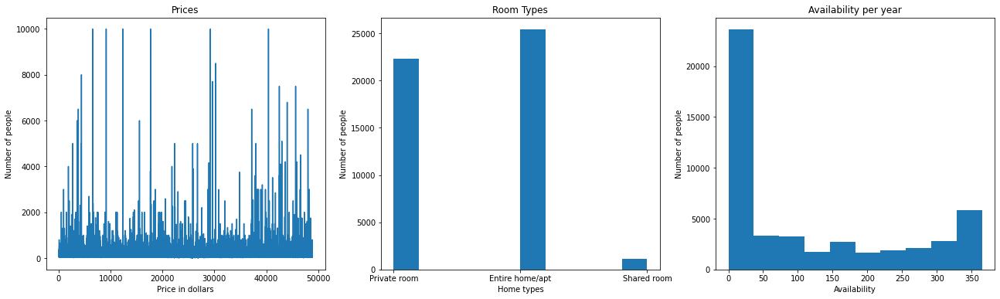

In [0]:
fig, ax = plt.subplots(1,3,figsize = (22,6))

ax[0].plot(airbnb_df["price"])
ax[0].set_title("Prices")
ax[0].set_xlabel("Price in dollars")
ax[0].set_ylabel("Number of people")

ax[1].hist(airbnb_df["room_type"])
ax[1].set_title("Room Types")
ax[1].set_xlabel("Home types")
ax[1].set_ylabel("Number of people")

ax[2].hist(airbnb_df["availability_365"])
ax[2].set_title("Availability per year")
ax[2].set_xlabel("Availability")
ax[2].set_ylabel("Number of people")

##Demo

To demonstrate the difference, we picked 10 property for both students and workers by searching the dense areas of schools/cafes and businesses. Then, categorized them by what they are close to.

In [0]:
# Properties which are close to schools and cafes...
demoStudent = airbnb_df[(airbnb_df["id"] == 12363920) | (airbnb_df["id"] == 12363920) | (airbnb_df["id"] == 19912256) | (airbnb_df["id"] == 29630553) | (airbnb_df["id"] == 10125955) | (airbnb_df["id"] == 9678327) | (airbnb_df["id"] == 7073436) | (airbnb_df["id"] == 36231580) | (airbnb_df["id"] == 458268) | (airbnb_df["id"] == 170761) | (airbnb_df["id"] == 11923881)]

#Properties which are close to businesses...
demoWorker = airbnb_df[(airbnb_df["id"] == 32239034) | (airbnb_df["id"] == 32635018) | (airbnb_df["id"] == 32240476) | (airbnb_df["id"] == 32225189) | (airbnb_df["id"] == 13623891) | (airbnb_df["id"] == 15056538) | (airbnb_df["id"] == 9352565) | (airbnb_df["id"] == 21878080) | (airbnb_df["id"] == 12713863) | (airbnb_df["id"] == 170761) | (airbnb_df["id"] == 31990505)]

### Prices Comparison
In the prices graph, we can see that the peak of students and workers are different, that means students mostly rest in properties that cost 100 dollars per month, while the workers rest by mostly 200 dollars. In addition the mean of students is 122, while the mean of workers is 177, again, the obvious difference in means also ensures that workers rest in higher prices.

Mean of price - Students:  122.66666666666667 Mean of price - Workers 177.36363636363637


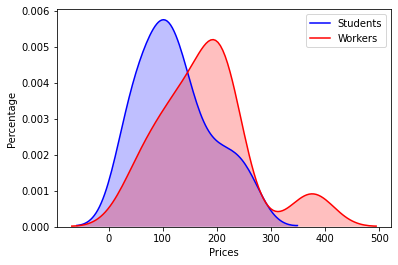

In [0]:
import seaborn as sns
stu = sns.kdeplot(demoStudent["price"], shade = True, label = "Students", color = "b")
wrk = sns.kdeplot(demoWorker["price"], shade = True, label = "Workers", color = "r")
stu.set_xlabel("Prices")
stu.set_ylabel("Percentage")

meanStu = demoStudent["price"].mean()
meanWork = demoWorker["price"].mean()
print("Mean of price - Students: ", meanStu, "Mean of price - Workers", meanWork)

###Room types
Room types are generally different, the students group tends to rest more in private rooms, while the workers group tends to rest more in entire home/apartment as we assumed.

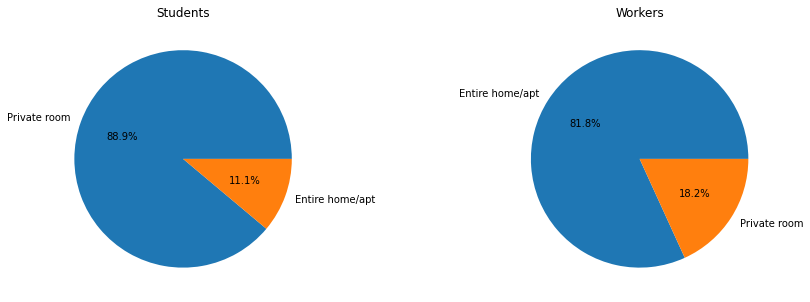

In [0]:
fig, ax = plt.subplots(1,2,figsize = (15,5))

ax[0].pie(demoStudent["room_type"].value_counts(), labels = demoStudent["room_type"].value_counts().index, autopct='%1.1f%%')
ax[0].set_title("Students")

ax[1].pie(demoWorker["room_type"].value_counts(), labels = demoWorker["room_type"].value_counts().index, autopct='%1.1f%%')
ax[1].set_title("Workers")
plt.show()

### Availability Comparison
The availability difference between 2 groups is obvious, the means of students and workers are respectively: 58 and 238, so the students might find 58 days availability enough, while workers might need more available time to rest in that home. Also, the graph visualize the difference very well, students' rise is workers' fall, at the same time, students' fall is workers' rise.

Mean of Availability - Students:  58.333333333333336 Mean of Availability - Workers 238.1818181818182


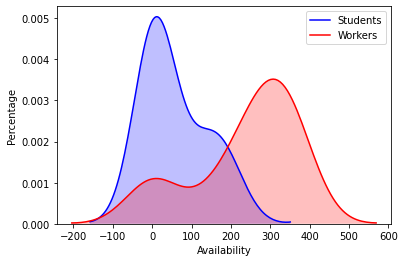

In [0]:
stu = sns.kdeplot(demoStudent["availability_365"], shade = True, label = "Students", color = "b")
wrk = sns.kdeplot(demoWorker["availability_365"], shade = True, label = "Workers", color = "r")
stu.set_xlabel("Availability")
stu.set_ylabel("Percentage")

meanStu = demoStudent["availability_365"].mean()
meanWork = demoWorker["availability_365"].mean()
print("Mean of Availability - Students: ", meanStu, "Mean of Availability - Workers", meanWork)

### T-Test
Lastly, we conduct a 2 sampled t-test with significance level = 0.05 in order to measure the significance of preference differences between students sample and workers sample.  

In [0]:
prst, prP = stats.ttest_ind(demoStudent["price"], demoWorker["price"])
rtst, rtP = stats.ttest_ind(demoStudent["room_type"].value_counts(), demoWorker["room_type"].value_counts())
avst, avP = stats.ttest_ind(demoStudent["availability_365"], demoWorker["availability_365"])
print("T-Test of prices: ", prP, "T-Test of room-types: ", rtP, "T-Test of availability: ", avP)

T-Test of prices:  0.14276439337720584 T-Test of room-types:  0.8585786437626906 T-Test of availability:  0.001880788915970608


While we fail to reject the null hypothes for resting price and room types difference between students and workers, the availability per year seems to be highly significant, so we reject null hpyothesis for this one and conclude that the workers might rest in homes which have availability different than what students rest in. 

## Conclusion:
Our aim in this project was to compare the home preference of students with the workers, to achieve this, we firstly collect the data from NYC datasets website and cleaned the them from unnecessary columns and nulls. Then we generated maps of schools, cafes, airbnb properties and large-scale businesses, and plotted graphs of 3 choices: price, room types and availability per year to visualize and get a better understanding of the data. Finally, we selected 10 people from both students and workers by looking at the map where the properties are close to schools and cafes, and where they are close to large-scale businesses. With our sample we plotted figures which shows difference between prices, room types and availability, compared their means and conduct a t-test between them, and found out that while the difference between the samples' price and room type parameter might be insignificant and we failed to reject the null hypothesis of price and room types, we rejected the null hypothesis that claims the students' and workers' preference on home's availability per year is same, so we concluded that the students tend to rest in homes that have different availability per year than where workers rest.

## To Do:
* We can use machine learning to find worker and student Airbnb rental locations more efficently and with significantly larger sample sizes. We plan to use knn for this.
* We hope to use other two parameters we couldn't reject. When we increase sample size with Machine learning we hypothesize that we will be able to reject null hypothesis of price and room_type.